In [3]:
!pip install folium


In [44]:
from IPython.display import display, HTML

In [45]:
import pandas as pd
import numpy as  np
import matplotlib.pyplot as plt
import seaborn as sns



In [39]:
import folium
from folium.plugins import HeatMap


In [40]:
import pandas as pd

# Load Zomato restaurant data and location data
df = pd.read_csv("zomato_data.csv")
geo = pd.read_csv("Geographical Coordinates.csv")

# Quick preview
df.head(), geo.head()


(  online_order book_table   rate  votes            rest_type  \
 0          Yes        Yes  4.1/5    775        Casual Dining   
 1          Yes         No  4.1/5    787        Casual Dining   
 2          Yes         No  3.8/5    918  Cafe, Casual Dining   
 3           No         No  3.7/5     88          Quick Bites   
 4           No         No  3.8/5    166        Casual Dining   
 
                                           dish_liked  \
 0  Pasta, Lunch Buffet, Masala Papad, Paneer Laja...   
 1  Momos, Lunch Buffet, Chocolate Nirvana, Thai G...   
 2  Churros, Cannelloni, Minestrone Soup, Hot Choc...   
 3                                        Masala Dosa   
 4                                Panipuri, Gol Gappe   
 
                          cuisines approx_costfor_two_people listed_intype  \
 0  North Indian, Mughlai, Chinese                       800        Buffet   
 1     Chinese, North Indian, Thai                       800        Buffet   
 2          Cafe, Mexican, Ita

In [41]:
import numpy as np

# Cleaning 'rate' column
df['rate'].replace('-', np.nan, inplace=True)
df['rate'] = df['rate'].astype(str).str.replace('/5', '', regex=False)
df['rate'] = pd.to_numeric(df['rate'], errors='coerce')
df['rate'].fillna(df['rate'].median(), inplace=True)

# Cleaning 'approx_costfor_two_people'
df['approx_costfor_two_people'] = df['approx_costfor_two_people'].astype(str).str.replace(',', '', regex=False)
df['approx_costfor_two_people'] = pd.to_numeric(df['approx_costfor_two_people'], errors='coerce')
df['approx_costfor_two_people'].fillna(df['approx_costfor_two_people'].median(), inplace=True)

# Fill categorical columns
df['dish_liked'].fillna("Not Available", inplace=True)
df['cuisines'].fillna("Other", inplace=True)
df['rest_type'].fillna("Unknown", inplace=True)

# Fill votes
df['votes'].fillna(df['votes'].median(), inplace=True)
df['votes'] = df['votes'].astype(int)

# Encode binary columns
df['online_order'] = df['online_order'].map({'Yes': 1, 'No': 0})
df['book_table'] = df['book_table'].map({'Yes': 1, 'No': 0})

# Final type conversions
df['rate'] = df['rate'].astype(float)
df['approx_costfor_two_people'] = df['approx_costfor_two_people'].astype(int)


In [13]:
import pandas as pd
import numpy as np

# Load the datasets
df = pd.read_csv("zomato_data.csv", encoding='utf-8')
geo = pd.read_csv("Geographical Coordinates.csv", encoding='utf-8')

# -----------------------------
# Step 1: Clean the 'rate' column
# -----------------------------
df['rate'].replace('-', np.nan, inplace=True)
df['rate'] = df['rate'].astype(str).str.replace('/5', '', regex=False)
df['rate'] = pd.to_numeric(df['rate'], errors='coerce')
df['rate'].fillna(df['rate'].median(), inplace=True)

# -----------------------------
# Step 2: Clean the 'approx_costfor_two_people' column
# -----------------------------
df['approx_costfor_two_people'] = df['approx_costfor_two_people'].astype(str).str.replace(',', '')
df['approx_costfor_two_people'] = pd.to_numeric(df['approx_costfor_two_people'], errors='coerce')
df['approx_costfor_two_people'].fillna(df['approx_costfor_two_people'].median(), inplace=True)

# -----------------------------
# Step 3: Handle missing values in categorical columns
# -----------------------------
df['dish_liked'].fillna("Not Available", inplace=True)
df['cuisines'].fillna("Other", inplace=True)
df['rest_type'].fillna("Unknown", inplace=True)

# -----------------------------
# Step 4: Fill missing values in 'votes'
# -----------------------------
df['votes'].fillna(df['votes'].median(), inplace=True)

# -----------------------------
# Step 5: Binary encoding for 'online_order' and 'book_table'
# -----------------------------
df['online_order'] = df['online_order'].map({'Yes': 1, 'No': 0})
df['book_table'] = df['book_table'].map({'Yes': 1, 'No': 0})

# -----------------------------
# Step 6: Data type conversion
# -----------------------------
df['rate'] = df['rate'].astype(float)
df['votes'] = df['votes'].astype(int)
df['approx_costfor_two_people'] = df['approx_costfor_two_people'].astype(int)

# -----------------------------
# Step 7: Merge with geographical coordinates
# -----------------------------
merged_df = pd.merge(df, geo, on='listed_incity', how='left')

# -----------------------------
# Step 8: Final checks (optional but recommended)
# -----------------------------
print(merged_df.info())
print(merged_df.isnull().sum())
print(merged_df.describe())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 51717 entries, 0 to 51716
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   online_order               51717 non-null  int64  
 1   book_table                 51717 non-null  int64  
 2   rate                       51717 non-null  float64
 3   votes                      51717 non-null  int32  
 4   rest_type                  51717 non-null  object 
 5   dish_liked                 51717 non-null  object 
 6   cuisines                   51717 non-null  object 
 7   approx_costfor_two_people  51717 non-null  int32  
 8   listed_intype              51717 non-null  object 
 9   listed_incity              51717 non-null  object 
 10  Latitude                   46137 non-null  float64
 11  Longitude                  46137 non-null  float64
dtypes: float64(3), int32(2), int64(2), object(5)
memory usage: 4.7+ MB
None
online_order                  

In [42]:
import folium
from folium.plugins import HeatMap

# Create map centered on Bangalore
bangalore_map = folium.Map(location=[12.9716, 77.5946], zoom_start=12)

# Create a list of points
heat_data = merged_df[['Latitude', 'Longitude']].dropna().values.tolist()

# Add HeatMap
HeatMap(heat_data).add_to(bangalore_map)

# Display
bangalore_map


In [43]:
# 1. Filter Italian restaurants
italian_df = merged_df[merged_df['cuisines'].str.contains('Italian', case=False, na=False)].copy()

# 2. Ensure Latitude and Longitude are numeric (convert any weird strings to NaN)
italian_df['Latitude'] = pd.to_numeric(italian_df['Latitude'], errors='coerce')
italian_df['Longitude'] = pd.to_numeric(italian_df['Longitude'], errors='coerce')

# 3. Drop rows where coordinates are missing
italian_df = italian_df.dropna(subset=['Latitude', 'Longitude'])


In [19]:
import folium

# Create map centered on Bangalore
italian_map = folium.Map(location=[12.9716, 77.5946], zoom_start=12)

# Add restaurant markers
for i, row in italian_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['cuisines']} | Rating: {row['rate']}"
    ).add_to(italian_map)

# Display map
italian_map


In [22]:
def get_marker_color(rating):
    if rating >= 4.0:
        return 'green'
    elif rating >= 3.5:
        return 'orange'
    else:
        return 'red'

# Map with colored markers
italian_map = folium.Map(location=[12.9716, 77.5946], zoom_start=12)

for _, row in italian_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['cuisines']} | Rating: {row['rate']}",
        icon=folium.Icon(color=get_marker_color(row['rate']))
    ).add_to(italian_map)

italian_map


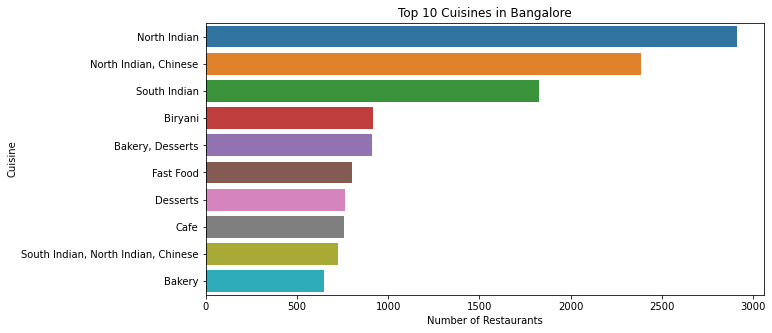

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# Top 10 cuisine types
top_cuisines = merged_df['cuisines'].value_counts().nlargest(10)
plt.figure(figsize=(10,5))
sns.barplot(x=top_cuisines.values, y=top_cuisines.index)
plt.title("Top 10 Cuisines in Bangalore")
plt.xlabel("Number of Restaurants")
plt.ylabel("Cuisine")
plt.show()


In [31]:
import folium

# Filter for Italian cuisine and drop rows with missing coordinates
italian_df = merged_df[
    merged_df['cuisines'].str.contains('Italian', na=False)
].dropna(subset=['Latitude', 'Longitude'])

# Create a map centered on Bangalore
italian_map = folium.Map(location=[12.9716, 77.5946], zoom_start=12)

# Add markers to the map
for idx, row in italian_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['cuisines']} - {row['rest_type']}",
        icon=folium.Icon(color='green', icon='cutlery', prefix='fa')
    ).add_to(italian_map)

# Show the map
italian_map


In [33]:
print(merged_df.columns)


Index(['online_order', 'book_table', 'rate', 'votes', 'rest_type',
       'dish_liked', 'cuisines', 'approx_costfor_two_people', 'listed_intype',
       'listed_incity', 'Latitude', 'Longitude'],
      dtype='object')


In [35]:
# Filter rows where 'cuisines' column contains 'North Indian'
north_indian_count = merged_df[merged_df['cuisines'].str.contains("North Indian", case=False, na=False)].shape[0]

print(f"Number of restaurants serving North Indian cuisine: {north_indian_count}")


Number of restaurants serving North Indian cuisine: 21085


In [36]:

from collections import Counter


cuisine_list = merged_df['cuisines'].dropna().str.split(', ')
flat_cuisines = [cuisine for sublist in cuisine_list for cuisine in sublist]


cuisine_counts = Counter(flat_cuisines)
most_common_cuisine = cuisine_counts.most_common(1)

print(f"The most commonly offered cuisine is: {most_common_cuisine[0][0]} ({most_common_cuisine[0][1]} restaurants)")


The most commonly offered cuisine is: North Indian (21085 restaurants)


In [37]:

avg_cost_by_locality = merged_df.groupby('listed_incity')['approx_costfor_two_people'].mean
highest_cost_locality = avg_cost_by_locality.idxmax()
highest_cost = avg_cost_by_locality.max()

print(f"The locality with the highest average cost for dining is: {highest_cost_locality} (INR {highest_cost:.2f})")


The locality with the highest average cost for dining is: Church Street (INR 770.36)


In [38]:

high_vote_df = merged_df[merged_df['votes'] > 1
top_rated_rest_type = high_vote_df.groupby('rest_type')['rate'].mean().sort_values(ascending=False)

top_rest_type = top_rated_rest_type.idxmax()
top_rating = top_rated_rest_type.max()

print(f"The restaurant type with the top rating (among those with over 1000 votes) is: {top_rest_type} with an average rating of {top_rating:.2f}")


The restaurant type with the top rating (among those with over 1000 votes) is: Bakery with an average rating of 4.80
